# NYC 311 Capstone - Recurrent Neural Networks
## Stephen Behunin | BrainStation | stephenbehuninwork@gmail.com
_______________________________________________________
## Notebook Executive Summary
The goal of this section is implement an RNN for short term prediction on the 311 dataset.

**NOTE: This workbook follows a large portion of the tensorflow.org tutorial linked here:** https://www.tensorflow.org/tutorials/structured_data/time_series#baselines
___________________________________________________________________________________

## Layout
______________________________________________________
#### Pre-amble
- Importing packages
- Reading in the data

#### Part 1 - Data preparation for Neural Networks
- Feature Engineering Timestamps
- Splitting the dataset
- Normalizing the data

#### Part 2 - Defining functions and preparing background processes
- Data Windowing
- Indexing and Offsetting
    - Creating the Month window
- Splitting
- Plotting the windows
- Making windowed datasets

#### Part 3 - Baseline & Metrics
- Loss
- Mean Squared Error
- Mean Absolute Percentage Error (MAPE)

#### Part 4 - Neural Networks
- General Neural Networks

#### Part 5 - Simple RNNs
- Simple Model

#### Part 6 - GRUs

#### Part 7 - GRU with Adam Optimizer

#### Part 8 -  GRU with SGD-Nesterov Optimizer

#### Part 9 - The Final Comparison

#### Part 10 - Optimization

#### Conclusion

# Pre-amble
_________________________

This section covers importing packages for use in the notebook and reading in the complaint and timeseries datasets.

## Importing packages
____________________________

In [1]:
# Basics
import matplotlib.pyplot as plt
import scipy as sp
import numpy as np
import pandas as pd

# Plotting
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import seaborn as sns

# Timeseries specific
from sklearn.model_selection import TimeSeriesSplit

# Stats
from statsmodels.api import tsa # time series analysis
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import month_plot
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statistics import mean

# Warning Suppresion
import warnings
warnings.filterwarnings('ignore')

# Tensorflow tutorial specific
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import tensorflow as tf

# Setting graphing parameters
mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

### Reading in the timeseries dataframe

First the dataset is read in from the source file.

In [2]:
# Reading in the dataframe
time_df = pd.read_csv("311 Data/nyc_timeseries_311.csv", index_col = 0)

Then the index of the dataframe is reset.

In [3]:
# Resetting the index of the dataframe
time_df.reset_index(level=0, inplace=True)
time_df

,Created Date,Total SRs
0,2010-01-01,2782
1,2010-01-02,3692
2,2010-01-03,5426
3,2010-01-04,7977
4,2010-01-05,7119
...,...,...
3647,2019-12-27,4454
3648,2019-12-28,3988
3649,2019-12-29,3928
3650,2019-12-30,4952


Next the "Created Date" column is converted into the correct datatype.

In [4]:
# Converting the datetime columns
time_df["Created Date"] = pd.to_datetime(time_df["Created Date"])

Then the dataset is limited to 2010-2018, and the result is checked.

In [5]:
# Limiting the dataset to 2010-2018
time_df = time_df[time_df["Created Date"].dt.year < 2019]
# Checking if the drop was successful
time_df["Created Date"].dt.year.value_counts()

2012    366
2016    366
2010    365
2011    365
2013    365
2014    365
2015    365
2017    365
2018    365
Name: Created Date, dtype: int64

In [6]:
# Displaying the dataframe information
time_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3287 entries, 0 to 3286
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Created Date  3287 non-null   datetime64[ns]
 1   Total SRs     3287 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 77.0 KB


# Part 1- Data Preparation for Neural Networks
____________________________________

## Feature Engineering the Timestamps


The datetime column is limited by its current form. In order to extract more information from the timestamp the dates will be converted into seconds. Then several features can be extracted from the resulting values.

In [7]:
# Extracting a list of timestamps from the dataframe
date_time = pd.to_datetime(time_df.pop('Created Date'), format='%d.%m.%Y %H:%M:%S')

# Converting the timestamps into seconds
timestamp_s = date_time.map(pd.Timestamp.timestamp)

The feature to be extracted from this data is the yearly periodicity, this will give the main seasonal component necessary for the analysis.

In [8]:
# Setting the year and day values in seconds
day = 24*60*60
year = (365.2425)*day

The method used to extract information on periodicity will be applying sine and cosine to the timestamps. These transformations are used in feature engineering to isolate cycles within data and turn them into usable signal.

In [9]:
# Creating the transformed sin and cosine columns
time_df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
time_df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Now the yearly cycle can be plotted.

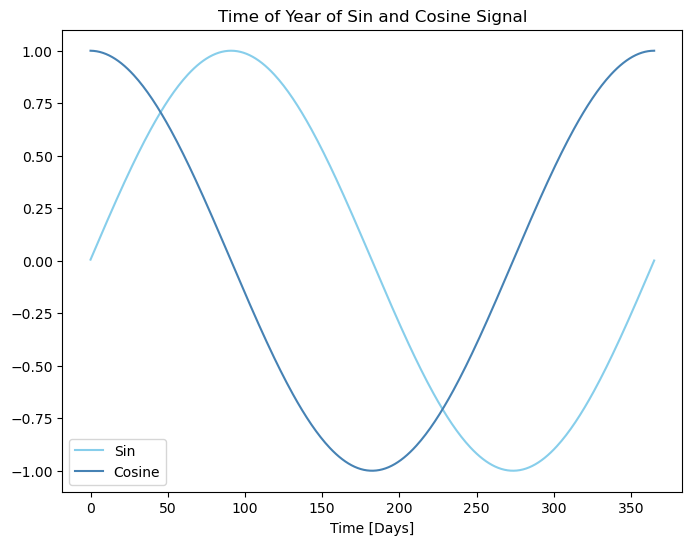

In [10]:
# Plotting the Yearly Sin and Cosine signals
plt.plot(np.array(time_df['Year sin'][:366]), label = "Sin", color = "skyblue")
plt.plot(np.array(time_df['Year cos'][:366]), label = "Cosine", color = "steelblue")
plt.xlabel('Time [Days]')
plt.title('Time of Year of Sin and Cosine Signal')
plt.legend()
plt.show()

This result shows the extracted signal for the sine and cosine transformations. There is a clear peak and low for each interpretation that will assist in identifying and predicting yearly changes. The height of the wave encodes information on the target variable "Total SRs" relating to the time of year at every point along its curve.

## Splitting the dataset

Now the dataset can be split into several pieces for use in the model. The portions of the data will be for training, validation and testing respectively.

In [11]:
# Splitting the data into train and test sets
column_indices = {name: i for i, name in enumerate(time_df.columns)}

# The length of the dataset
n = len(time_df)

# Creating the training dataset
train_df = time_df[0:int(n*0.7)]

# Creating the validation dataset
val_df = time_df[int(n*0.7):int(n*0.9)]

# Creating the testing dataset
test_df = time_df[int(n*0.9):]

# Getting the number of features in the dataset
num_features = time_df.shape[1]

## Normalizing the data 

Next up is normalizing the dataset. This step is performed to scale the dataset and make the information interpretable by the Neural Networks. Without scaling comparisons between different parts of the dataset may be lead to skewed results or be altogther impossible.

For this analysis a simple mean is used to normalize the dataset. This calculation is also referred to as a Standard Scaler.

In [12]:
# Calculating mean and standard deviation of the training set
train_mean = train_df.mean()
train_std = train_df.std()

# Normalizing the training, validation and test sets
train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

Next the distributions of the normalized data will be checked for any obvious errors in the normalization process. A violin plot will be utilized for this purpose.

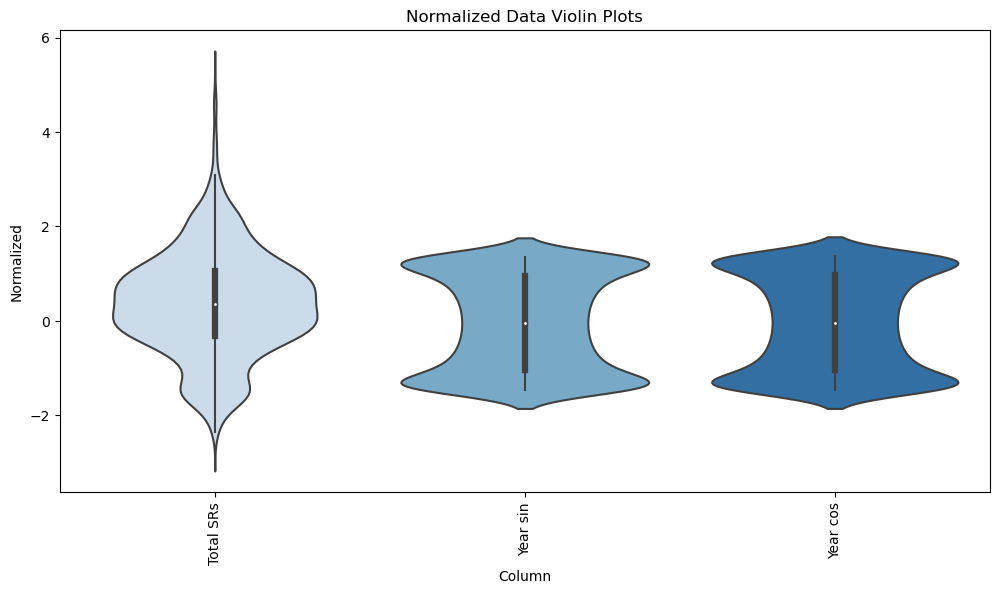

In [13]:
# Calculating the standard deviation of the dataframe
df_std = (time_df - train_mean) / train_std

# Formatting the identifier variables
df_std = df_std.melt(var_name='Column', value_name='Normalized')

# Plotting the violin plot
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std, palette = "Blues")
_ = ax.set_xticklabels(time_df.keys(), rotation=90 )
plt.title("Normalized Data Violin Plots")
plt.show()

There are no obvious issues with the normalization of the dataset. Each of the columns is correctly centered around zero and has a reasonable distribution. Since this plot returned a normal result the data is considered successfully normalized.

# Part 2 - Defining functions and preparing background processes
_____________________________________________________

The RNN models later in this notebook require very specific inputs and setup functions. This section is to devoted to setting up and testing all of the necessary functions for this analysis.

## Data Windowing

The RNN model used in this notebook relies on windowed data. Meaning that a subsample of the dataset is used to calculate each value consecutively. The key elements of the input windows are the width of the input and label windows, the time offset between the input and label, and which features are used for each. This is an illustration taken from the TensorFlow documentation describing the structure of a window.
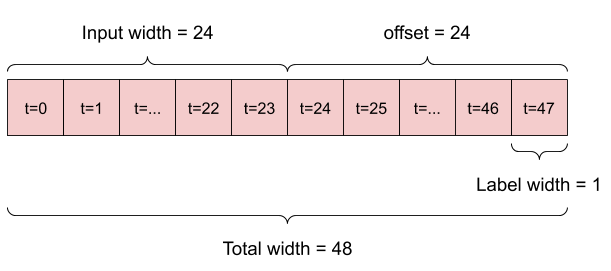
For this analysis the window will have a length of 1 month/30 days. This setup will be done through a WindowGenerator class that handles the indexing, splitting, plotting and batching of the windows.

## Indexing and Offsetting

This function handles the indexing and shifting of the window. It defines the indices of a window based on the input parameters and shifts the window the approriate amount for each iteration.

In [14]:
# Taken from Tensorflow
# Creating the Window Generator Class
class WindowGenerator():
    # Constructing the internal workings of the Window Generator Class
    def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
        # Store the raw data.
        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        # Work out the label column indices.
        self.label_columns = label_columns
        if label_columns is not None:
            self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
            self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

        # Work out the window parameters.
        self.input_width = input_width
        self.label_width = label_width
        self.shift = shift

        self.total_window_size = input_width + shift

        self.input_slice = slice(0, input_width)
        self.input_indices = np.arange(self.total_window_size)[self.input_slice]

        self.label_start = self.total_window_size - self.label_width
        self.labels_slice = slice(self.label_start, None)
        self.label_indices = np.arange(self.total_window_size)[self.labels_slice]
    # Creating a printing statement that show the window characteristics
    def __repr__(self):
        return '\n'.join([
            f'Total window size: {self.total_window_size}',
            f'Input indices: {self.input_indices}',
            f'Label indices: {self.label_indices}',
            f'Label column name(s): {self.label_columns}'])

To calculate the correct input size for the windows a Partical Autocorellation Function will be used. This function will show the correlation between the original values and lagged values. The lagged values with statistically significant correlation will be included in the input window.

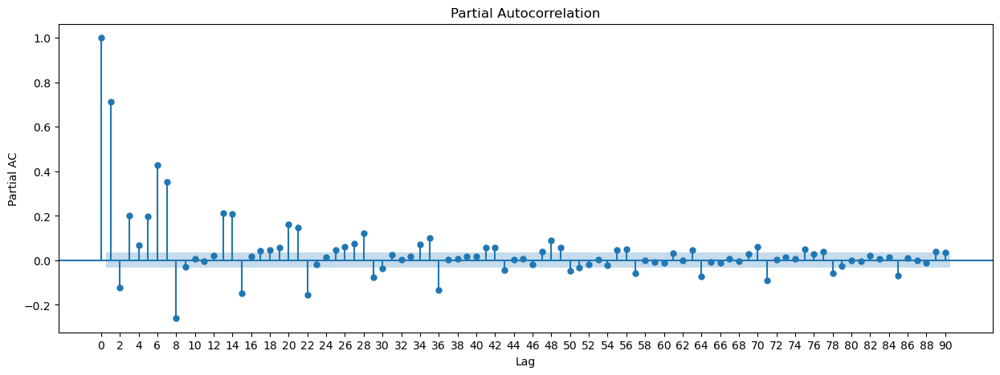

In [15]:
# Plotting the PACF
plt.figure(figsize=(15, 5))
plot_pacf(time_df["Total SRs"].dropna(), lags=90, ax=plt.gca())
plt.xlabel('Lag')
plt.xticks(np.arange(0, 91, 2))
plt.ylabel('Partial AC')
plt.show()

The vast majority of the correlated lags are within 30 days of the initial observation. Because of this the window will be set to take in 30 time periods/days of data. And because the goal of these models is to predict relatively short term data the prediction parameter will also be set to 30. Meaning that the windows will take in 30 days of data to predict the next 30 days.  The shift parameter in the window generator will be set to 30 as well, meaning that the first prediction for the model will occur 30 time periods/days after the intial observation.

### Creating the month Window

In [16]:
# Setting the month window
OUT_STEPS = 30
month = WindowGenerator(input_width = 30, label_width=OUT_STEPS, shift=OUT_STEPS, label_columns=['Total SRs'])

# Displaying the month window
month

Total window size: 60
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]
Label indices: [30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53
 54 55 56 57 58 59]
Label column name(s): ['Total SRs']

## Splitting 

Data windowing requires taking in a list of consectutive inputs and splitting them into the appropriate chunks for use in the function. This split occurs to separate the input data from the label data, with the input data used to create predictions on the label values. The function below will split the windows properly and return an object usable by the upcoming RNNs.

In [17]:
# Defining the Window Splitting Function
def split_window(self, features):
    inputs = features[:, self.input_slice, :]
    labels = features[:, self.labels_slice, :]
    if self.label_columns is not None:
        labels = tf.stack(
            [labels[:, :, self.column_indices[name]] for name in self.label_columns],
            axis=-1)

    # Setting the input shapes
    inputs.set_shape([None, self.input_width, None])
    labels.set_shape([None, self.label_width, None])

    return inputs, labels

WindowGenerator.split_window = split_window

Now that the window splitter is set it will be tested on the month dimensions set above.

In [18]:
# Stack three slices, the length of the total window.
month_window = tf.stack([np.array(train_df[:month.total_window_size]),
                           np.array(train_df[100:100+month.total_window_size]),
                           np.array(train_df[200:200+month.total_window_size])])
# Creating an example set of inputs and labels for the month window
month_inputs, month_labels = month.split_window(month_window)

# Printing the window, inputs, and labels shapes
print('All shapes are: (batch, time, features)')
print(f'Window shape: {month_window.shape}')
print(f'Inputs shape: {month_inputs.shape}')
print(f'Labels shape: {month_labels.shape}')
month.example = month_inputs, month_labels

All shapes are: (batch, time, features)
Window shape: (3, 60, 3)
Inputs shape: (3, 30, 3)
Labels shape: (3, 30, 1)


## Plotting the windows

Now that the window splitting is up and running the next task is visualizing the data. The function here creates graphs of the data with input, labels and predictions.

In [19]:
# Defining the plotting function
def plot(self, model=None, plot_col='Total SRs', max_subplots=3):
    inputs, labels = self.example
    plt.figure(figsize=(8, 7))
    plot_col_index = self.column_indices[plot_col]
    max_n = min(max_subplots, len(inputs))
    
    # Creating a plot for the maximum number of desired subplots
    for n in range(max_n):
        plt.subplot(max_n, 1, n+1)
        
        plt.ylabel(f'{plot_col}- Normalized')
        plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)
        plt.xlabel('Time [Days]')
        plt.tight_layout()

        if self.label_columns:
            label_col_index = self.label_columns_indices.get(plot_col, None)
        else:
            label_col_index = plot_col_index

        if label_col_index is None:
            continue

        plt.scatter(self.label_indices, labels[n, :, label_col_index],
                    edgecolors='k', marker = '+', label='Labels', c='black', s=64)
        
        if model is not None:
            predictions = model(inputs)
            plt.scatter(self.label_indices, predictions[n, :, label_col_index], 
                  marker='p', edgecolors='k', label='Predictions',
                  c='crimson', s=64)
            plt.xlabel('Time [Days]')

        if n == 0:
            plt.title("Prediction Plots")
            plt.legend()
    # Labeling and displaying the plots
 
    plt.show()
# Setting the plot function to .plot
WindowGenerator.plot = plot

These graphs are an example of the plotting function in action, they show the first three time periods of the data in the appropriate windows. Three plots like these will be used to analyze the results of the modeling along with some other evaluation metrics.

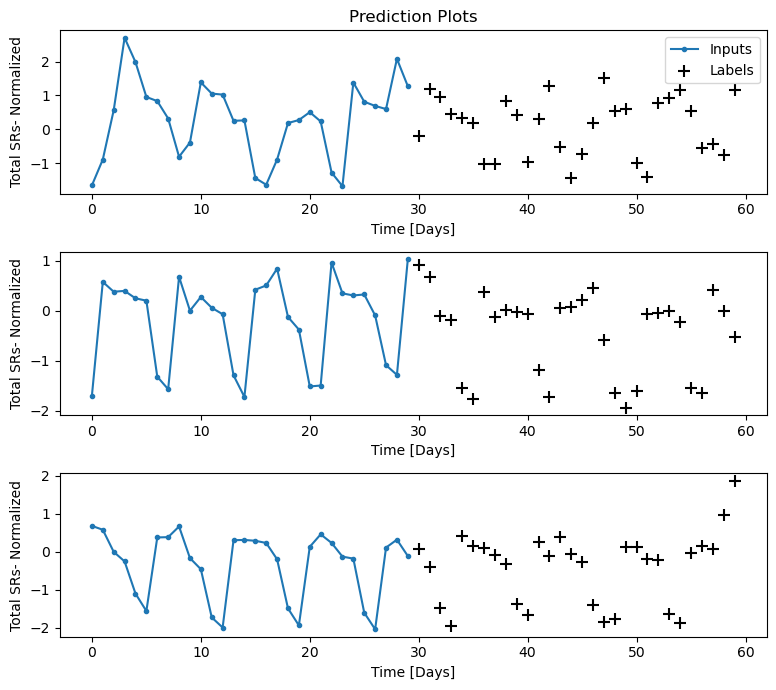

In [20]:
# Plotting the month window
month.plot()

## Making windowed datasets

The "make_dataset" function creates training, validation and testing datasets from a timeseries dataset in a windowed format. This allows for easily iterating over the data in batches.

In [21]:
# Defining the dataset function
def make_dataset(self, data):
    data = np.array(data, dtype=np.float32)
    ds = tf.keras.preprocessing.timeseries_dataset_from_array(
        data=data,
        targets=None,
        sequence_length=self.total_window_size,
        sequence_stride=1,
        shuffle=True,
        batch_size=32,)

    ds = ds.map(self.split_window)

    return ds
# Assigning the .make_dataset to the WindowGenerator class
WindowGenerator.make_dataset = make_dataset

Now the different portions of the new datasets will have their properties changed to be more easily accessible

In [22]:
# Setting the train, validation, and testing properties
@property
def train(self):
    return self.make_dataset(self.train_df)

@property
def val(self):
    return self.make_dataset(self.val_df)

@property
def test(self):
    return self.make_dataset(self.test_df)

# Setting the example property for testing
@property
def example(self):
    """Get and cache an example batch of `inputs, labels` for plotting."""
    result = getattr(self, '_example', None)
    if result is None:
        # No example batch was found, so get one from the `.train` dataset
        result = next(iter(self.train))
        # And cache it for next time
        self._example = result
    return result

# Assigning the changed properties to the WindowGenerator class 
WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

The example function produces datasets in the same manner as the real functions. In this example it gives the dimensions of example data over the month window.

In [23]:
for example_inputs, example_labels in month.train.take(1):
    print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
    print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 30, 3)
Labels shape (batch, time, features): (32, 30, 1)


# Part 3 -  Baseline & Metrics
______________________________________

To get a baseline to compare all of the future models a baseline class is created. It predicts the same number of days and has access to the same amount of data as the rest of the models. However it only uses the last day of data and predicts the value of the last day for the entire prediction window.

19/19 [==============================] - 0s 4ms/step - loss: 2.3984 - mean_absolute_percentage_error: 310.6451


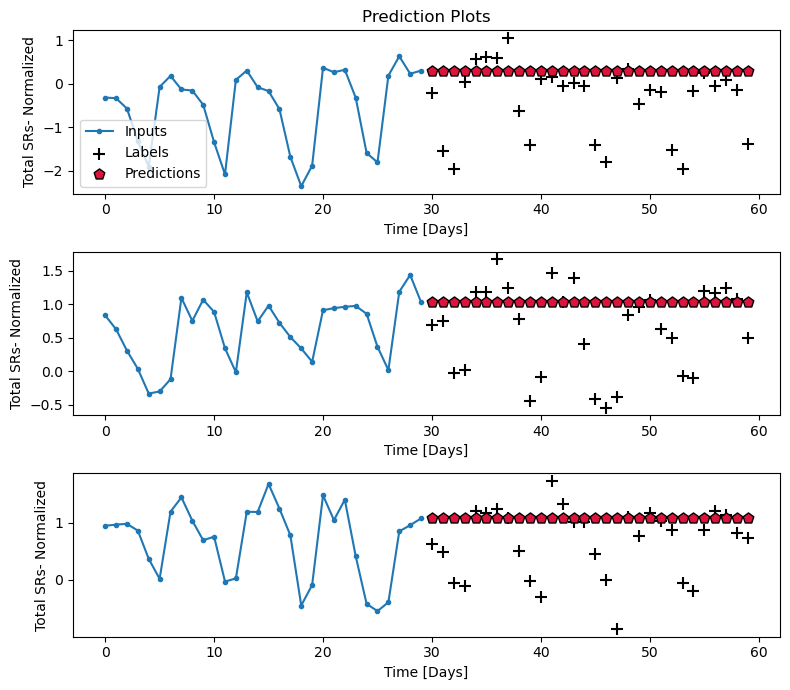

In [24]:
# Creating a MultiStepLast Baseline class
class MultiStepLastBaseline(tf.keras.Model):
  def call(self, inputs):
    return tf.tile(inputs[:, -1:, :], [1, OUT_STEPS, 1])

# Initializing and compiling the baseline
last_baseline = MultiStepLastBaseline()
last_baseline.compile(loss=tf.losses.MeanSquaredError(),
                      metrics=[tf.metrics.MeanAbsolutePercentageError()])
# Creating empty dictionaries for performance information
multi_val_performance = {}
multi_performance = {}

# Creating columns with validation evaluation information
multi_val_performance['Last'] = last_baseline.evaluate(month.val)

# Creating columns with testing evaluation information
multi_performance['Last'] = last_baseline.evaluate(month.test, verbose=0)

# Plotting the predictions for the baseline
month.plot(last_baseline)

As expected the model didn't fare very well in its predictions. Using the last value as a simple line has varying degrees of success depending on the arrangment that the data happens to be in. Sometimes the predictions miss the majority of the data by a huge amount, and other times the model seems to have drawn a half way decent Least Squares Regression line purely by chance. 

But just comparing the results visually is not sufficient, to be more precise the model is scored on loss (Mean Squared Error) and Mean Absolute Percentage Error (MAPE). Both of which will be explained to give an understanding of the iterative optimization process for the next models.

## Loss

Loss is a term for the cost function of a model. A cost function is aimed at assisting in parameter optimization by describing the wrongness of the model. A low loss is optimal but the rate at which the loss improves is also taken into consideration for the modeling process. The graph below depicts a loss curve for both training and validation sets on an overfitted version of an example model from Kaggle. 
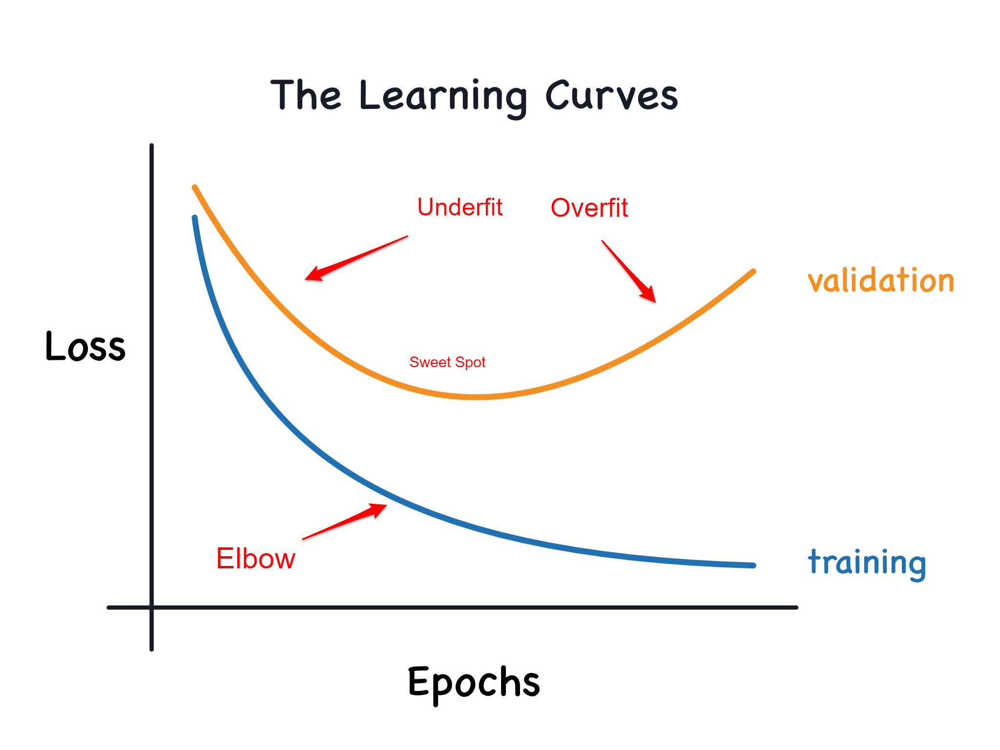

Loss curves for the training and validation datasets are quite different from each other. This training curve shows a a sharp decline followed by a gradual curve that eventually approaches zero as the epochs progress. This shape indicates a high rate of improvement in the first quarter of the training, followed by a slowing of progress until the last quarter of training the model at which the loss essentially plateaus. A general rule of thumb for evaluating training loss curves is to find an elbow in the curve which shows a distinct slowing in the rate of improvement for the loss function. Beyond this point the model is at best inefficient and at worst overfitting to the training data. 

This overfitting effect can be seen in the validation loss curve. Since the two curves are created from totally separate scorings on different portions of the data the curves can diverge radically from each other. The validation curve is created from applying the trained model to the validation data at the end of each epoch. As the model is trained the model learns about the dataset and both scores improve up to a point. Beyond that point where the model has learned all of the information in the training data that is not due to randomness the model begins to overfit. The model ascribes variation due to chance to patterns within the data. And subsequently the predictions for the validation set worsen as the model attempts to fit patterns to the data that aren't actually there.

The sweet spot for loss curves is generally characterized as minimizing loss while keeping the rate of improvement fairly high. The high improvement rate indicates that the model is learning a significant amount each epoch. This reduces the chances of overfitting the model and keeps the validation score higher. Because the rate is considered rather than a hard target loss score the model avoids sacrificing a set percentage of the variation in the data which can leave valuable insight unmined.

## Mean Squared Error

Since this analysis is a regression problem the loss function used in the modeling is Mean Squared Error. The formula:
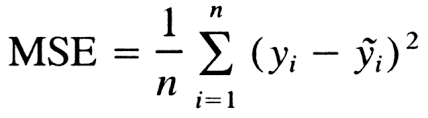
This loss measure takes the mean of the entire squared loss values for a set of predictions. The squaring of the errors leads to large errors being more impactful than smaller errors penalizing outliers. Visually the process looks like this:

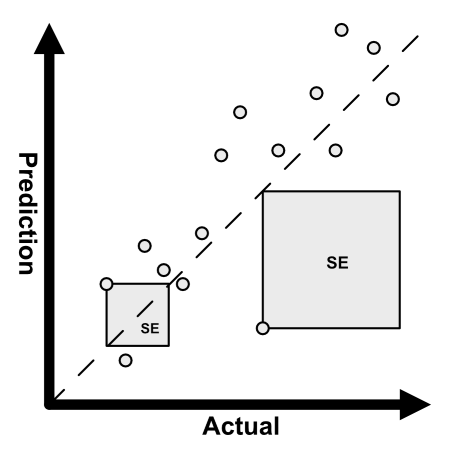

## Mean Absolute Percentage Error (MAPE)
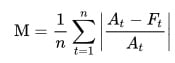
MAPE is the primary evaluation metric used for this analysis. The core of MAPE is very similar to Mean Squared Error with a few key differences. Both metrics take and measure the mean of the errors, but MAPE is a more normalizing method compared to MSE. Where MSE squares errors MAPE takes the absolute value of each error and converts it into a percentage. 

The absolute value step of the formula converts all of the errors into positive values that do not cancel each other out. And the conversion to a percentage makes MAPE comparable across different scales of datasets by making the actual error insignificant in favor of comparing the percentage of wrongness. Because of this enhanced flexibility MAPE is often used as a scoring mechanism so that models can be more easily judged against each other.


# Part 4 - Neural Networks
__________________________________________________


To address this timeseries problem the type of neural network employed is an Recurrent Neural Network (RNN). RNNs are frequently used for timeseries work and can take several forms. But beforing diving into directly modeling anything an explanation of neural network and RNN specific structures will take place.

## General Neural Networks

In general neural networks are comprised of several core components:
- An input layer, which takes in data.
- An hidden layer, which acts on the data.
- An output layer, which produces an output from the data in the hidden layer.
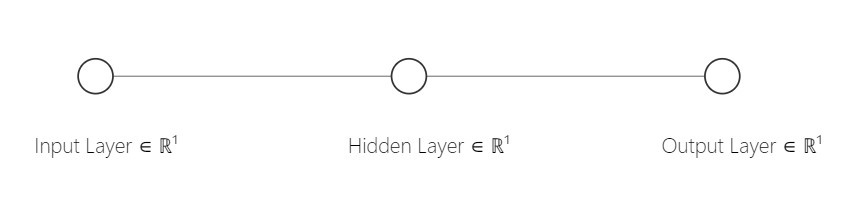
The simplest form of which as visualized above as a single step input, followed by an operation in the hidden layer, and finally a single output. These layers together form a single node or perceptron. Combinations of nodes like the ones illustrated below constitute a neural network. 

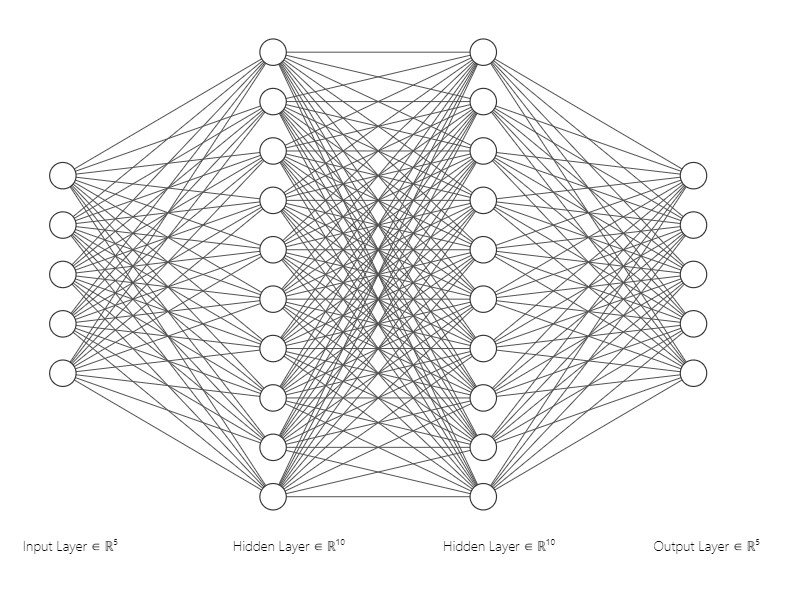

These combinations of nodes pass data to each other and collectively work towards creating the desired outputs. The actual functioning of each perceptron is also more complicated than the basic explanation above. Although a full explanation of neural networks is outside the scope of this notebook a brief explanation of workings of a NN node is provided here.

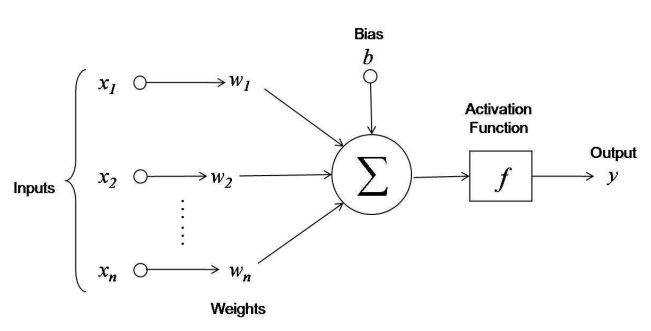

First the data is fed into the input layer (X1, X2, Xn), then weights are applied to each value. These weights are what is learned by the neural network to form better predictions. Then the weighted inputs are subjected to bias in each part of the hidden layer. Inputs can be fed into multiple parts of the hidden layer and the bias at each can be different. This step also sums all of the inputs at each portion of the hidden layer. Next the data is passed through an activation function which applies the specified function. Both hidden and output layers utilize activation functions. The goal of the activation function is to transform the data in some way for use in the next layer or as a prediction.

The number of layers, the number of nodes within the layers, bias values, and the type of activation functions used are all considered parameters as they are set before the modeling is initiated. The weights applied at every edge of the process are what constitutes the models state. The more layers that data progresses through in the neural network the more complex it becomes. Information from other inputs, weights and biases is added until the final output layer produces a prediction. 

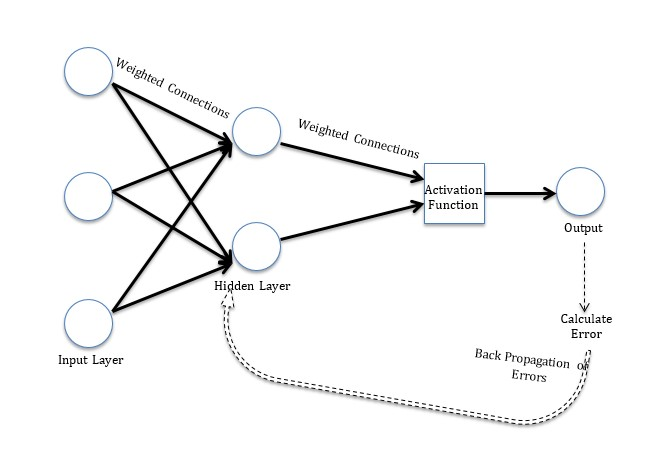

Weights are adjusted every feed-forward and backpropogation cycle. Feed-forward is the data process described above that pushes data from one end of the model to the other. Backpropogation consists of feeding the end result of the feed-forward back through the model up until the input layer. This is the step in which weights are updated and the actual learning occurs. A cycle of forward-feeding and backpropogation is called an epoch. Weights are constantly updated as epochs progress and eventually improve the models wrongness as training continues. 

# Part 5 - Simple RNNs
_____________________________

Now that the very basic concepts of neural networks have been explained the first iteration of an RNN will be implemented. A quick note on the setup of these models. Neural networks can be seriously unstable and achieve radically different results on the same data when run multiple times. To combat this a combination of parameter adjustments and evaluation procedures will be used. The specific parameters chosen and the reasoning behind them will be explained later as they become relevant. 
For the evaluation methodology two key decisions were made:
1. All models will be run for 30 epochs, this gives the viewer a chance to see the progession of the model at reasonable scale.
2. The models will be ranked according to the best results achieved in each progression rather than on the final epochs score. Meaning that the if the model achieves a somewhat stable MAPE score of 200 but rises to 250 at later epochs it will be regarded as having scored 200. This selection allows for better comparison between models and illustrates the lifecycle of the network rather than attempting to display only the best optimization.

Another important note is the number of models presented in this notebook. Only three iterations of the various models were chosen for display to keep the flow of the document and complexity manageable. In reality dozens of combinations of parameters and configurations were attempted but are not included in this notebook. The process of selection and the list of parameters tried will be explained further at the end of the modeling section. 

## Simple Model

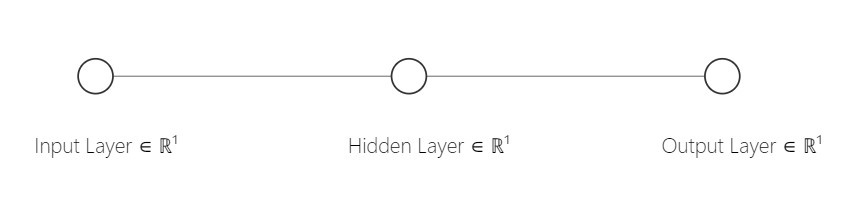

The first RNN to be implemented will be very simple, as the name implies. It will consist of just one input layer, one hidden layer composed of one SimpleRNN cell, and one output layer composed of one Dense cell. This configuration is included largely to demonstrate the power of even very simplistic RNNs on timeseries data. 

A quick primer on the difference between regular neural network cells and RNN cells. The primary function of RNN cells is to fight amnesia within the models. Regular models when trained tend to "forget" data as new data is inputted, leading to a system that cannot accurately describe large sequences of data such as time series. RNNs combat this with an unusual structure:
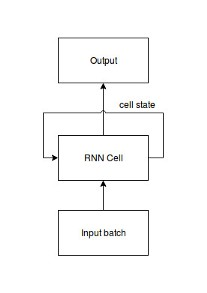
In addition to the regular components of a neural network cell RNN cells have a hidden state that is inputted into the cell after every activation. The hidden state contains information on all of the past learning the cell has done. By reinputting the knowledge regularly the model "remembers" information that came before. By combining the past knowledge with the current inputs the model keeps a running log of information across the entire dataset rather than the small portion currently inputted.

To fit the model first the "compile_and_fit" function is defined, this function handles setting the parameters for the model and performing the compiling, fitting and storage of performance data.

In [25]:
# Max Epochs is set to 30 on all models
MAX_EPOCHS = 30

# Defining the compile and fit function
def compile_and_fit(model, window, patience=2):
    
    # Setting the model parameters
    model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(lr=.01, clipnorm=1),
                metrics=[tf.metrics.MeanAbsolutePercentageError()])
    
    # Storing the performance data in a history variable
    history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                       )
    return history

Next the model structure is defined and the model fitted. The performance data is also put into a table for comparison between models later on. Then the predictions of the model are plotted using the plotting function defined earlier. 

19/19 [==============================] - 0s 806us/step - loss: 1.6708 - mean_absolute_percentage_error: 137.9732


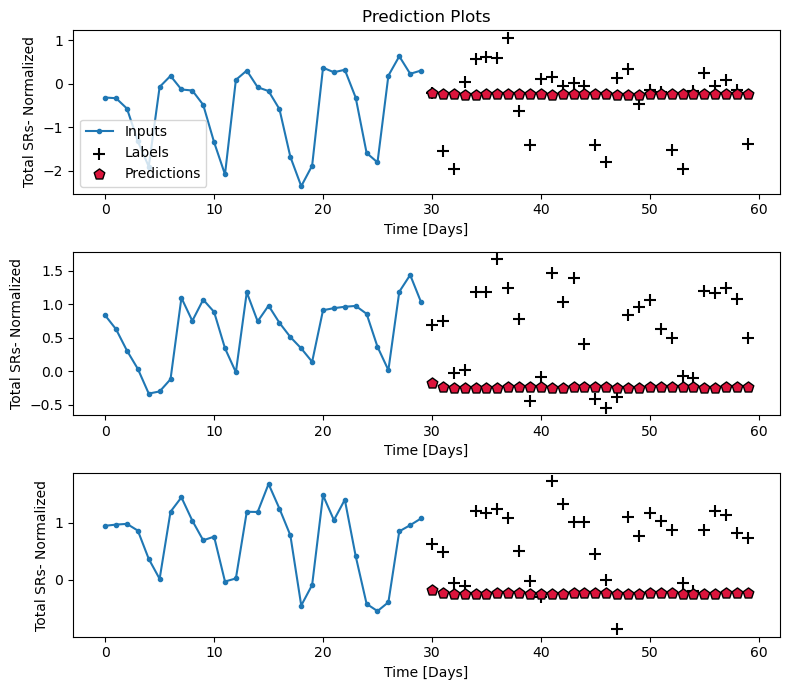

In [26]:
# Specifying the structure of the RNN
simple_model = tf.keras.models.Sequential([
    tf.keras.layers.SimpleRNN(1, return_sequences = True),
    tf.keras.layers.Dense(units=1)
])

# Compiling and fitting the model
history = compile_and_fit(simple_model, month)

# Storing the performance data
IPython.display.clear_output()
multi_val_performance['simple_model'] = simple_model.evaluate(month.val)
multi_performance['simple_model'] = simple_model.evaluate(month.test, verbose=0)

# Plotting the predictions of the model
month.plot(simple_model)

Examining the graph of the model predictions the strategy for the model seems to be predicting the first few days of the prediction window and then using set value for the rest of the prediction. This approach while not perfect is significantly better than the baseline of shifting the values right one as a prediction.

To better understand the progression and overall performance of the model two more tools are used. The first is a visualization of loss and MAPE validation scores for the current iteration of the model included below. However because of the wide variation that can be seen in different iterations of these models a static image of graphs is provided that is illustrative of the average progression of the model.

Second is a table showing the validation MAPE scores for 5 runs of the model and an average score across all of the runs. This setup should assist in comparing the models more precisely and eliminate some of the instability inherent in this type of modeling.

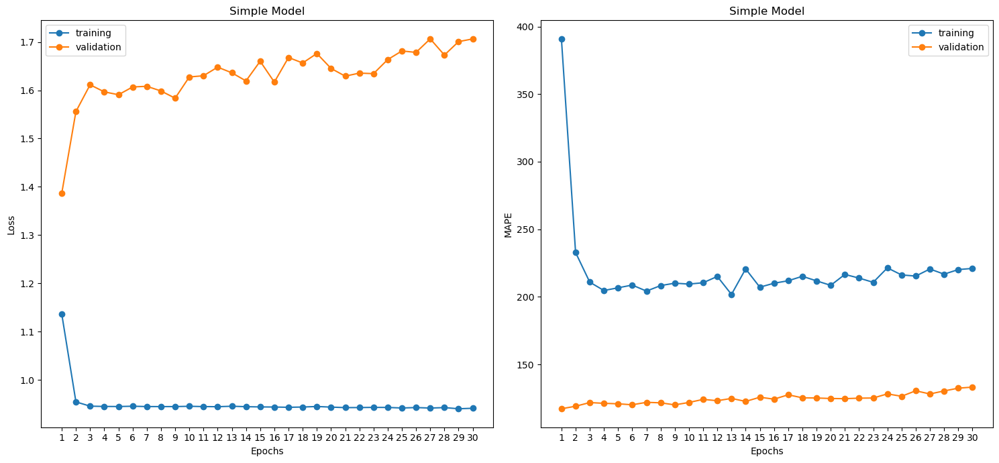

Graph Interpretation: This configuration for an RNN is wildly unstable. Many of the performance graphs from different runs look nothing alike. The curves for both the loss function and MAPE scores can take on starkly different patterns and a broad range of values. But there were several likely paths the progressions took. The graph above was one of the most common patterns that emerged from the trial runs. 

Looking at the loss functions the training and validation losses are almost exactly mirrored. As the epochs progress the loss function for the training sets decreases rapidly the first epoch and then levels off almost immediately for the duration of the training. An inverse pattern is seen in the validation scores except the loss scores are progressively worse for the duration of the training rather than leveling off. This pattern indicates that the majority of the learning took place in the first epoch. After that point the model is overfitting. 

This theory is validated by examining the MAPE scores for the model. The training scores experience a nearly identical curve to the loss training values. While the validation MAPE scores start around 120 and steadily increase as the model is overfit to the training data and the epochs progress.

As mentioned this is only one of many possible outcomes for this arrangement. To counteract some of the uncertainty a table showing 5 runs of the model and the minimum MAPE score achieved is displayed here. These scores should give more precise insight into the models performance.

In [27]:
# Initializing the validation MAPE Table
val_mape_table = {"Simple Model" : [137, 109, 123, 121, 124, 122.8, 28], 
                  "GRU Model Adam" : [110, 106, 115, 112, 112, 111, 9], 
                  "GRU Model SGD" : [100, 106, 101, 102, 104, 102.6, 6]}
val_mape_table = pd.DataFrame(val_mape_table, index = ["Run 1", "Run 2", "Run 3", "Run 4", "Run 5", "Average Score", "Spread"])
val_mape_table.drop(axis = 1, columns = ["GRU Model Adam", "GRU Model SGD"])

,Simple Model
Run 1,137.0
Run 2,109.0
Run 3,123.0
Run 4,121.0
Run 5,124.0
Average Score,122.8
Spread,28.0


The average score of the model is 122.8, which compared to the baseline score of 310.65 is a vast improvement! Clearly the fitting of a model even in a basic manner greatly improves the accuracy of the predictions. However the model is far from perfect. The results of the model are erratic as evidenced by the spread of 28% in the MAPE scores for the five runs. Some of this variation is inherent to the randomized start up of all neural networks. But a significant portion can be attributed to the simplicity of the model that allows for wildly different paths to emerge without much chance for normalization. 

This Simple RNN configuration is a good start to the modeling but is prone to wild variation and gradient problems. To address some of these concerns the next type of RNN will be implemented in the form of GRUs.

# Part 6 - GRUs
______________________________________________________________

GRUs or Gated Recurrent Units are a type of Long Short Term Memory (LSTM) architecture aimed at reducing the complexity of LSTMs while providing the same benefits of the architecture. The specific issue addressed by LSTM/GRU architecture is vanishing gradients. Vanishing gradients occur when weight adjustments in the backpropagation phase of learning grow smaller and smaller eventually "vanishing" by the time the first layers are reached. 

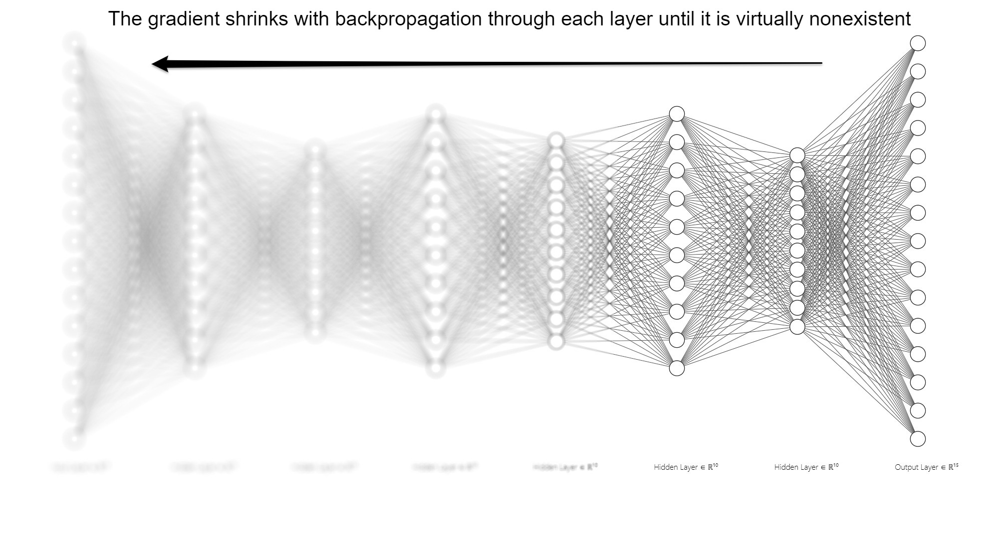

This vanishing gradient results in a kind of short term memory where the model only learns on new data rather than learning across the time, the same type of problem that RNNs were implemented to solve in the first place. To address this GRUs use a cell state similar to the hidden state of the overall RNN except local to each cell. The GRU also uses its reset and update gates which help the cell decide which information to keep in the hidden state and which information to drop. 
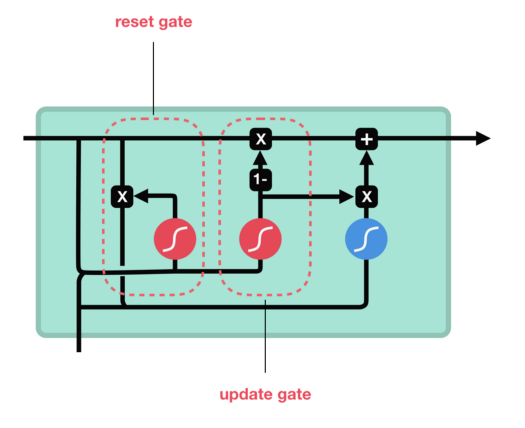
The combination of hidden states for the model, recurring feedback within the cells and the LSTM architecture which generates cell specific hidden states is highly effective. It allows for a model that can process large amounts of sequential data and avoid vanishing gradients while learning patterns effectively. 

# Part 7 - GRU with Adam Optimizer 
___________________________________________________

The first iteration of an GRU RNN will be fitted with an Adam optimizer. The optimizers function and purpose will be discussed in more detail with the next section. For now the only relevant details are that the optimizer determines how the model goes about learning the weights for its hidden state. 

First the compile and fit function is defined with the desired parameters.

In [28]:
# Max Epochs is set to 30 on all models
MAX_EPOCHS = 30

# Defining the compile and fit function
def compile_and_fit(model, window, patience=2):

    # Setting the model parameters
    model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.Adam(lr=.01, clipnorm=1),
                metrics=[tf.metrics.MeanAbsolutePercentageError()])
    
    # Storing the performance data in a history variable
    history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                       )
    return history

Next the model architecture is specified. In this case the model will have this architecture:
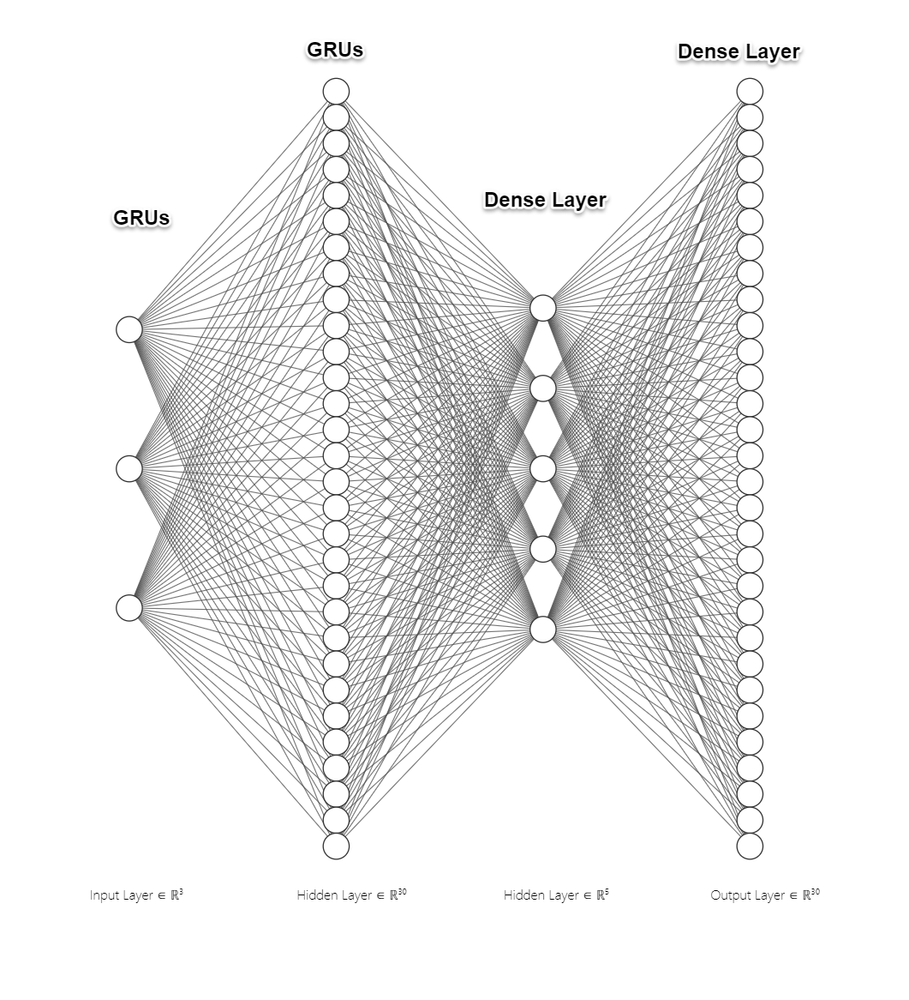
A layer of 3 GRU cells serves as the input layer which passes directly into a layer of 30 GRUs for the first hidden layer. Next the data is passed into 5 Dense cells for the second hidden layer. Finally the output layer of 30 Dense cells creates the outputs for the model. Dense layers are connected to every input for each of their cells. In this case the Dense designation is specified in the keras library as type of layer.

19/19 [==============================] - 0s 2ms/step - loss: 1.1347 - mean_absolute_percentage_error: 124.3119


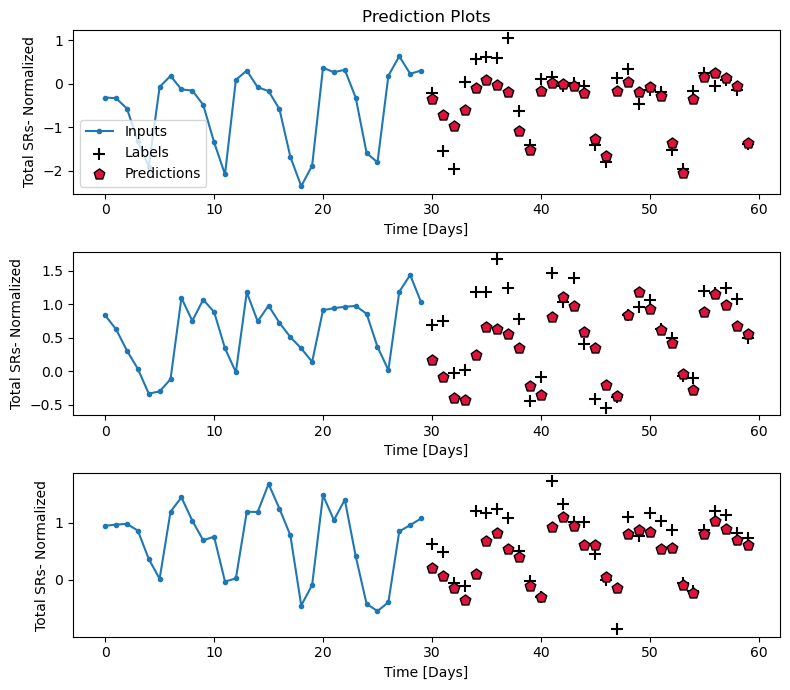

In [29]:
# Specifying the structure of the RNN
GRU_model_ADAM = tf.keras.models.Sequential([
    tf.keras.layers.GRU(3, return_sequences=True, dropout = .1),
    tf.keras.layers.GRU(30, return_sequences=True, dropout = .1),
    tf.keras.layers.Dense(units=5),
    tf.keras.layers.Dense(units=30)
])

# Compiling and fitting the model
history = compile_and_fit(GRU_model_ADAM, month)

# Storing the performance data
IPython.display.clear_output()
multi_val_performance['GRU_model_ADAM'] = GRU_model_ADAM.evaluate(month.val)
multi_performance['GRU_model_ADAM'] = GRU_model_ADAM.evaluate(month.test, verbose=0)

# Plotting the predictions of the model
month.plot(GRU_model_ADAM)

Compared to the last model's plot evidence of learning is clear in this graph. The model is learning basic patterns within the data and predicting values more closely in a large number of cases. An important note however is that implementing a pattern can backfire on some occasions. Attempting to predict and failing in the opposite direction results in a larger miss than the model would have just sticking with one prediction the entire time. But the cost to benefit ratio of fitting is evident in the performance graphs and scoring table below.

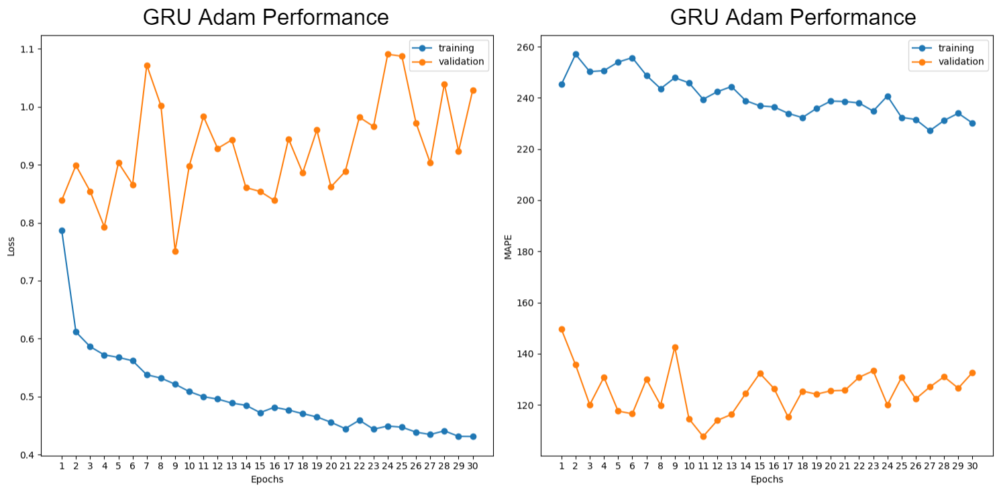

In [30]:
# Displaying the validation mape table
val_mape_table.drop(axis = 1, columns = ["Simple Model", "GRU Model SGD"])

,GRU Model Adam
Run 1,110
Run 2,106
Run 3,115
Run 4,112
Run 5,112
Average Score,111
Spread,9


The GRU Adam model scored on average 11.8% better than the Simple Model. Before digging more into the scores first the performance plots should be examined. A sample graph was once again picked for this model as the variance between the iterations makes interpretation precarious on live demonstrations. 

This particular chart illustrates some volatility in the accuracy of predictions, when the model is right it is very right and the scores for the epoch are excellent, when the model makes a misstep the resulting error is larger than a mean prediction. Specifically looking at the loss curves the training curve is very different from the validation curve. Where the training curve slowly decreases after an intial drop the validation "curve" is erratic and actually rises over time indicating overfitting of the model. 

Similarly in the MAPE performance the training score slowly improves while the validation score is more variable. It has several spikes but follows a generally bowl shaped pattern. The MAPE improves at first up to a point around 11 epochs after which it increases to levels approaching seen at only the 2nd epoch of training. 

Despite its flaws however the average scores and spread indicate that this is a superior model to the Simple Model before it. The average score as noted is 11.8% lower and the spread is just 1/3 the size of the Simple Model. This indicates a more stable and better performing model overall. But these results can still be improved on, to do this the next model will take a deeper look into optimizers to really boost model performance. 

# Part 8 - GRU with SGD-Nesterov Optimizer
____________________________________________________________________________

To understand the focus of this section, the differentiation in optimizers, a basic understanding of optimizers and the problem they are attempting to solve is necessary. First the problem, Gradient Descent as illustrated below is the method by which weights are calculated in neural networks. 

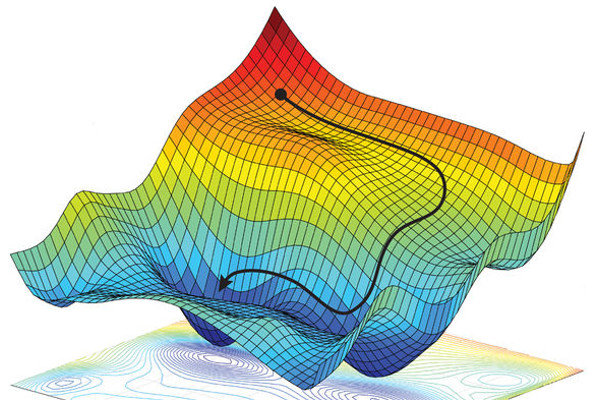

The goal of any model is to minimize a loss function. Here the loss function is represented in 3D space with the red portions of the loss surface symbolizing high loss values (bad). And blue portions representing the lowest possible loss values (good), the colors inbetween follow the standard ROYGVIB progression from high to low loss scores. Gradient Descent works by calculting the steepest descent possible from any given point. In the case of the model the weights of the model are adjusted in the direction that will reduce the loss function the fastest i.e. in the direction of the steepest gradient. 

Given this goal of minimizing loss in most direct route Gradient Descent is employed, but the details of the deployment are critical. Several problems arise with GD calculations:
1. The computation can be extremely intensive and consume huge amounts of resources.
2. By the same property above it can be very time consuming.
3. Learning paths can become stuck in local minima, low loss functions that are lower than the surrounding area but not the lowest possible value. 
4. Infinite loops that trap the learning in one area or pattern without improving. 

These are just a few of the possible problems to be dealt with in Gradient Descent. How these problems are dealt with are the core of different optimizers. All of the optimizers perform the same basic function but as illustrated below they do it in different ways with differing results.

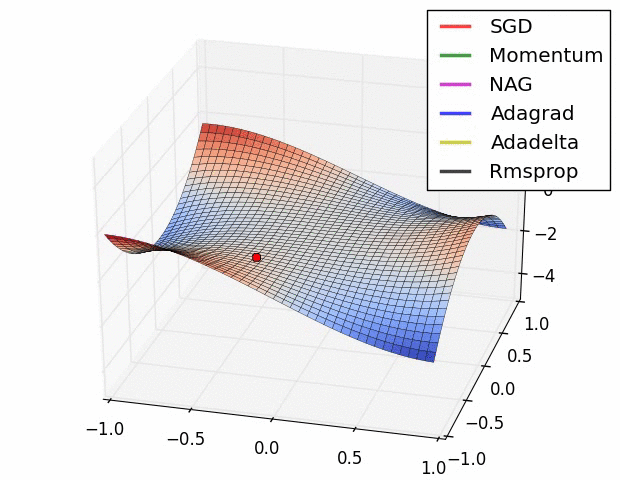

The details of the various optimizers are to complex to explain in this analysis. Suffice it to say that the different optimizers take different approaches some of which are uniquely suited for timeseries analysis. In this notebook thus far the Adam optimizer has been used. Adam is a very popular optimizer for a wide variety of tasks and is generally considered a standard optimizer. However for the next model a Schotastic Gradient Descent with Nesterov optimizer will be used. 

Schotastic Gradient Descent works by semi-randomly selecting a direction of descent and testing whether the direction gets it to a lower or higher point on the loss surface. If the path leads lower the path is taken, if not another semi-random choice is made. This results in a Gradient Descent method that is generally faster than optimizers that calculate all possible gradient changes. As well as breaking out of local minima more easily as the jump to an unexpected path may result in a previously undiscovered route toward lower values. 

There are several drawbacks to this method however. The first is that the process can be inefficient with random choices not always leading in good directions. Second is that the positive effects of the randomness can be squashed by improper parameter settings. The learning rate (size of jump for each step) if set too low may not be able to exit dips in the loss surface and result in randomness swirling around a local minima without progression. And since small steps are generally taken with SGD to mitigate some negatives of random selection this is a real concern.

But only experimentation will show if this optimizer is right for this task. To get started the "compile_and_fit" function is once again defined with the proper parameters.

In [35]:
# Max Epochs is set to 30 on all models
MAX_EPOCHS = 30

# Defining the compile and fit function
def compile_and_fit(model, window, patience=2):
    
    # Setting the model parameters
    model.compile(loss=tf.losses.MeanSquaredError(),
                optimizer=tf.optimizers.SGD(lr=.01, clipnorm=1, nesterov = True),
                metrics=[tf.metrics.MeanAbsolutePercentageError()])
    
    # Storing the performance data in a history variable
    history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      #callbacks=[early_stopping]
                       )
    return history

The structure for this model is identical to the previous one, the only change is the optimizer which has been set to SGD with "nesterov = True". Nesterov is a momentum method that calculates the gradients of potential positions differently than most standard options. 

19/19 [==============================] - 0s 2ms/step - loss: 1.7114 - mean_absolute_percentage_error: 102.8547


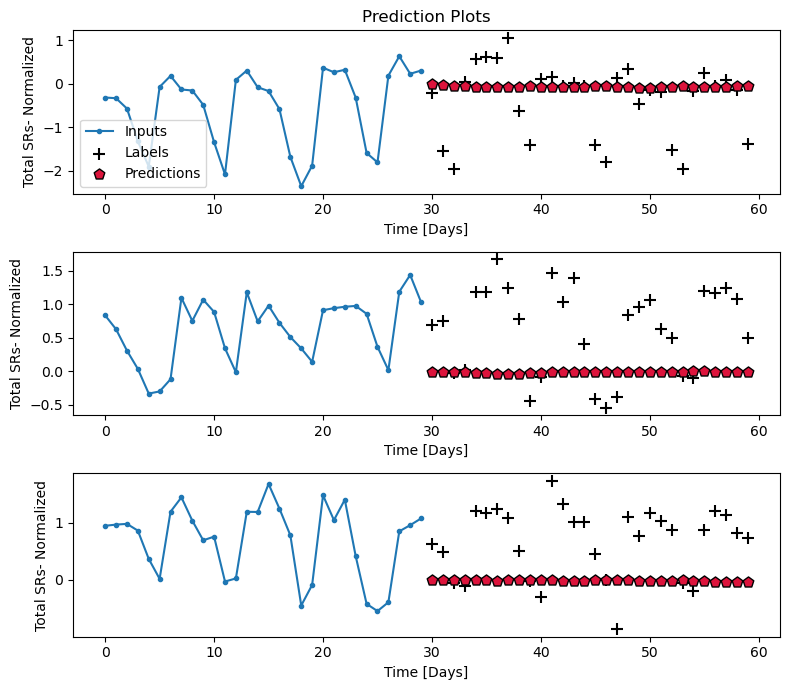

In [32]:
# Specifying the structure of the RNN
GRU_model_SGD = tf.keras.models.Sequential([
    tf.keras.layers.GRU(3, return_sequences=True, dropout = .1),
    tf.keras.layers.GRU(30, return_sequences=True, dropout = .1),
    tf.keras.layers.Dense(units=5),
    tf.keras.layers.Dense(units=30)
])

# Compiling and fitting the model
history = compile_and_fit(GRU_model_SGD, month)

# Storing the performance data
IPython.display.clear_output()
multi_val_performance['GRU_model_SGD'] = GRU_model_SGD.evaluate(month.val)
multi_performance['GRU_model_SGD'] = GRU_model_SGD.evaluate(month.test, verbose=0)

# Plotting the predictions of the model
month.plot(GRU_model_SGD)

This is an interesting plot for this particular model. The strategy of the model has seemingly regressed to that of the Simple Model with a nearly linear prediction. It is possible that the model found that predicting a straight line is on average the most efficient description of the data. However given the score on the model and the plots presented there is also a possibility that the graphing function is commiting some kind of consistent error. In this case the performance graphs will be given more weight.

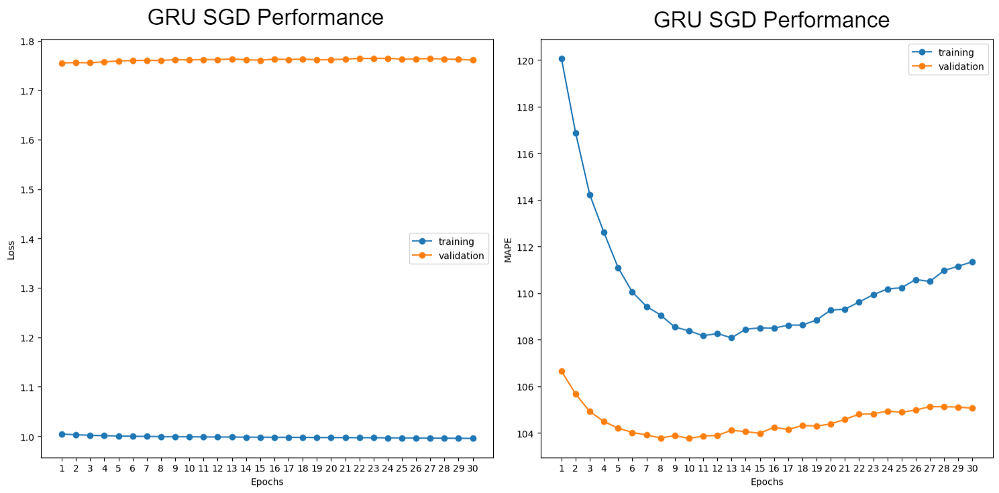

In [33]:
# Initializing the validation MAPE Table
val_mape_table.drop(axis = 1, columns = ["GRU Model Adam", "Simple Model"])

,GRU Model SGD
Run 1,100.0
Run 2,106.0
Run 3,101.0
Run 4,102.0
Run 5,104.0
Average Score,102.6
Spread,6.0


Although difficult to see due to the vast difference in scale the Loss performance graphs show a slightly more normal pattern. The same inverted pattern of validation vs training on the loss is present although the severity of both curves is heavily reduced. Another interesting aspect is that the vast majority of the epochs represent almost no change in Loss while the MAPE scores exhibit more visible trends. 

The MAPE score graphs for both training and validation follow the same shallow swoosh shape. Characterized by a high starting point, low elbow and gradual increase. The more random nature of the SGD optimizer is likely the cause of the training MAPE worsening through time, whereas the validation MAPE is expected to worsen beyond a point due to overfitting. 

Despite all of the irregularities and oddities of this model it is by far the most stable. The consistency between runs is indicative of the change in optimizer and the surprisingly normalizing effect of randomness. Both the spread and average score for the SGD Model are the best scores yet. These consistently low scores make the SGD an excellent candidate for this application. But the a final comparison of models will be done before declaring the best model.

# Part 9 - The Final Comparison
___________________________________________

In [34]:
# Displaying the validation MAPE table
val_mape_table

,Simple Model,GRU Model Adam,GRU Model SGD
Run 1,137.0,110,100.0
Run 2,109.0,106,106.0
Run 3,123.0,115,101.0
Run 4,121.0,112,102.0
Run 5,124.0,112,104.0
Average Score,122.8,111,102.6
Spread,28.0,9,6.0


Comparing the three models created in terms of their MAPE validation scores there is a clear winner. The GRU Model SGD has both best minimum MAPE score, the best average Minimum MAPE score and the smallest spread. Meaning the model performed the best and the most consistently.

However the difference isn't as stark as one might expect. For all of the complexity of the latter two models the simple model performed within 20% of the other models on average. The real advantage for the more complex models was the stabilizing effect seen in the score spread, although this effect as explained earlier is much stronger in the SGD model which produced very consistent results and performance graphs.

But there is a final set of test results to compare in order to make a final judgement. During each training phase both the validation data and test data scores were gathered. The test scores were hidden to allow for proper model selection to take place and avoid data leakage. Results of those tests are plotted below and will be the final judge of each model's efficacy. Once again because of the volatility of different runs of the models a representative graph has been fixed in place for analysis. 

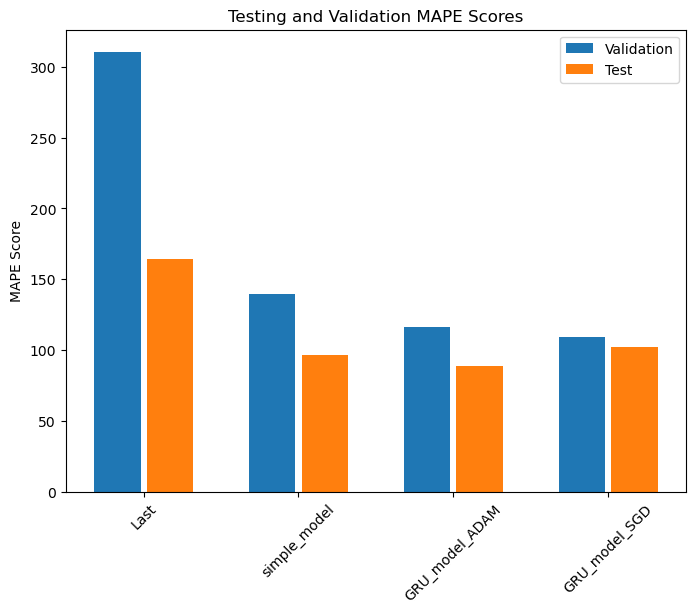

The results plotted in blue represent the validation scores already analyzed, as expected the models improve with each new iteration. What is interesting  in this plot is the disparity between validation and testing scores. Although each of the models performs better than the baseline by a significant margin the SGD model no longer has the best MAPE score. Instead both the simple model and the GRU Adam model outperform it, with the Adam model scoring the best overall. 

Additionally the gap between the model's validation and testing scores are an inmportant point. The most obvious difference is in the baseline performance. But both of the first two models display significant gaps between model performance on validation vs testing data. Whereas the GRU SGD model has a very small gap between testing and validation. This discrepancy likely comes from differences in the way the models learned throughout their training. 

Taking all factors into account these are the rankings from best to worst for the models:
1. GRU Adam Model
2. GRU SGD Model
3. Simple Model
4. Baseline

The GRU Adam model was chosen because it is significantly more stable than the Simple Model and performs better on the testing data than the SGD model. Additionally the difference in validation scores between the Adam and SGD models was small enough to make the testing data more relevant to overall model efficacy. Although the gap in validation vs testing isn't desirable it is small enough to be manageable. 

# Part 10 - Optimization
____________________________________

The work displayed in the modeling portion of this notebook is a fraction of the testing and model iterations performed to reach these results. This notebook is already quite long and technically heavy and the extra iterations and explanations were removed to make the notebook readable and sufficiently concise. A list of the additional parameters tested/experimented with is included here to give scale to the prep work done:

    - Additional layers
    - Different network structures
    - Gradient Clipping
    - Adjusted learning rates
    - Batch Normalization
    - Layer Normalization
    - Activation Randomization
    
The work included was a result of tweaking all of these variables and more to arrive at three concise models that illustrated the progression of the modeling. 

Even with all of this work there are still more ideas, techniques, methods that can be implemented to improve these results that were outside the scope/constraints of this project. This is a list of some of the desire next steps/improvements/redesigns that will help improve the predictive powers of these models:
- Rebuilding many of the tensorflow tutorial functions to allow for greater flexibility and implementation of advanced techniques
- Creating cross validation functions to create more robust performance metrics
- Enhanced plotting to better show the context around visualized results
- Implementation of techniques impossible with the current scoring setup such as:
    - Convolutional Layers
    - Time Distributed Dense Layers
    - Both of these techniques were incompatible with the scoring function used by the tensorflow tutorial
- A better method of tracking and iterating over different parameter combinations to tune model parameters
- Granularizing the data to allow for smaller scale predictions with increased amounts of data
- Recreating the original timseries scale for predictions to allow for more direct comparison between model predictions and reality. 

# Part 11 - Conclusion
_______________________________

This is the final section of this project. The inital portions of this workbook were devoted to the setup and explanation of RNNs, which gave context to the modeling in later sections. The results of the modeling were quite good, the baseline MAPE score for validation was nearly halved or more by all of the RNNs implemented. And the testing MAPE scores showed less vast but still significant improvement. Overall the modeling was a success, the models were able to predict a month of SR Volume with a reasonable degree of accuracy. And the later models with Adam and SGD optimizers were quite consistent in doing so.

But the project was not without its flaws. As noted in the optimization section there are many different techniques that were applied and some of them likely would have benefited from a more comprehensive implementation strategy. Additionally the desired next steps especially the convolutional layers technique likely would have benefited the project. But were impossible due to incomptability with the scoring system. The other large improvement would be recreating the actual timeseries predictions to give more concrete results for this modeling. 

All of the above points considered the modeling meets the third goal of this analysis. To accurately predict SR Volume on a short timescale. Implementation of the techniques in this project has been proved viable for this problem statement and would provide good insight for the City of New York. Should they ever implement a predictive system like this in their organizations.

# Notes
________________________
Timeseries Tensorflow Tutorial - the core data structures of this project were drawn from this tutorial.
https://www.tensorflow.org/tutorials/structured_data/time_series#baselines

Neural Network Visualizations
http://alexlenail.me/NN-SVG/index.html

Hands on Machine Learning with Sci-kit Learn, Keras and Tensorflow
https://machine-learning-apps.github.io/hands-on-ml2/15_processing_sequences_using_rnns_and_cnns

Adam Optimization
https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/

Loss Curve Graph
https://www.kaggle.com/ryanholbrook/overfitting-and-underfitting

Mean Squared Error
https://www.freecodecamp.org/news/machine-learning-mean-squared-error-regression-line-c7dde9a26b93/

MSE Visualization
https://towardsdatascience.com/visualizing-skill-assessment-metrics-24454e63385c

MAPE Formula
https://www.statisticshowto.com/mean-absolute-percentage-error-mape/

Node Explanation Diagram
https://tex.stackexchange.com/questions/132444/diagram-of-an-artificial-neural-network

Backpropagation Diagram
https://www.analyticsvidhya.com/blog/2017/09/creating-visualizing-neural-network-in-r/

RNN Cell Diagram
https://towardsdatascience.com/a-battle-against-amnesia-a-brief-history-and-introduction-of-recurrent-neural-networks-50496aae6740

GRU Cell Diagram
https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21

Gradient Descent Illustration
https://www.researchgate.net/figure/Non-convex-optimization-We-utilize-stochastic-gradient-descent-to-find-a-local-optimum_fig1_325142728

Optimizers GIF
https://medium.com/@ramrajchandradevan/the-evolution-of-gradient-descend-optimization-algorithm-4106a6702d39

Gradient Descent with Nesterov
https://machinelearningmastery.com/gradient-descent-with-nesterov-momentum-from-scratch/